In [4]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from matplotlib import pyplot
import calendar 
import datetime
import seaborn as sns
%matplotlib inline

In [5]:
df = pd.read_csv("../Data/Seattle_Real_Time_Fire_911_Calls.csv")
df.head()

,Address,Type,Datetime,Latitude,Longitude,Report Location,Incident Number
0,904 7th Av,Car Fire,05/22/2019 12:55:00 PM,47.606900,-122.329051,POINT (-122.329051 47.6069),F190051945
1,9610 53rd Av S,Aid Response,05/22/2019 12:55:00 PM,47.515984,-122.266529,POINT (-122.266529 47.515984),F190051946
2,106 Pike St,Aid Response,05/22/2019 12:57:00 PM,47.608849,-122.339945,POINT (-122.339945 47.608849),F190051950
3,1902 2nd Av,Aid Response,07/01/2019 07:45:00 AM,47.610972,-122.340465,POINT (-122.340465 47.610972),F190068848
4,4737 Roosevelt Way Ne,Unk Odor,07/01/2019 07:45:00 AM,47.663338,-122.317421,POINT (-122.317421 47.663338),F190068849


In [6]:
df.columns= df.columns.str.strip().str.lower()
df.head()

,address,type,datetime,latitude,longitude,report location,incident number
0,904 7th Av,Car Fire,05/22/2019 12:55:00 PM,47.606900,-122.329051,POINT (-122.329051 47.6069),F190051945
1,9610 53rd Av S,Aid Response,05/22/2019 12:55:00 PM,47.515984,-122.266529,POINT (-122.266529 47.515984),F190051946
2,106 Pike St,Aid Response,05/22/2019 12:57:00 PM,47.608849,-122.339945,POINT (-122.339945 47.608849),F190051950
3,1902 2nd Av,Aid Response,07/01/2019 07:45:00 AM,47.610972,-122.340465,POINT (-122.340465 47.610972),F190068848
4,4737 Roosevelt Way Ne,Unk Odor,07/01/2019 07:45:00 AM,47.663338,-122.317421,POINT (-122.317421 47.663338),F190068849


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1649256 entries, 0 to 1649255
Data columns (total 7 columns):
 #   Column           Non-Null Count    Dtype  
---  ------           --------------    -----  
 0   address          1649183 non-null  object 
 1   type             1649256 non-null  object 
 2   datetime         1649256 non-null  object 
 3   latitude         1648336 non-null  float64
 4   longitude        1648336 non-null  float64
 5   report location  1648372 non-null  object 
 6   incident number  1649256 non-null  object 
dtypes: float64(2), object(5)
memory usage: 88.1+ MB


In [8]:
df["datetime"] = pd.to_datetime(df["datetime"])

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1649256 entries, 0 to 1649255
Data columns (total 7 columns):
 #   Column           Non-Null Count    Dtype         
---  ------           --------------    -----         
 0   address          1649183 non-null  object        
 1   type             1649256 non-null  object        
 2   datetime         1649256 non-null  datetime64[ns]
 3   latitude         1648336 non-null  float64       
 4   longitude        1648336 non-null  float64       
 5   report location  1648372 non-null  object        
 6   incident number  1649256 non-null  object        
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 88.1+ MB


In [10]:
df.head()

,address,type,datetime,latitude,longitude,report location,incident number
0,904 7th Av,Car Fire,2019-05-22 12:55:00,47.606900,-122.329051,POINT (-122.329051 47.6069),F190051945
1,9610 53rd Av S,Aid Response,2019-05-22 12:55:00,47.515984,-122.266529,POINT (-122.266529 47.515984),F190051946
2,106 Pike St,Aid Response,2019-05-22 12:57:00,47.608849,-122.339945,POINT (-122.339945 47.608849),F190051950
3,1902 2nd Av,Aid Response,2019-07-01 07:45:00,47.610972,-122.340465,POINT (-122.340465 47.610972),F190068848
4,4737 Roosevelt Way Ne,Unk Odor,2019-07-01 07:45:00,47.663338,-122.317421,POINT (-122.317421 47.663338),F190068849


In [11]:
df["year"] = df["datetime"].apply(lambda time: time.year)

In [12]:
df.head()

,address,type,datetime,latitude,longitude,report location,incident number,year
0,904 7th Av,Car Fire,2019-05-22 12:55:00,47.606900,-122.329051,POINT (-122.329051 47.6069),F190051945,2019
1,9610 53rd Av S,Aid Response,2019-05-22 12:55:00,47.515984,-122.266529,POINT (-122.266529 47.515984),F190051946,2019
2,106 Pike St,Aid Response,2019-05-22 12:57:00,47.608849,-122.339945,POINT (-122.339945 47.608849),F190051950,2019
3,1902 2nd Av,Aid Response,2019-07-01 07:45:00,47.610972,-122.340465,POINT (-122.340465 47.610972),F190068848,2019
4,4737 Roosevelt Way Ne,Unk Odor,2019-07-01 07:45:00,47.663338,-122.317421,POINT (-122.317421 47.663338),F190068849,2019


In [13]:
df["year"].unique()

array([2019, 2020, 2005, 2003, 2004, 2006, 2007, 2008, 2009, 2010, 2011,
       2012, 2013, 2014, 2015, 2016, 2017, 2018, 2021, 2022], dtype=int64)

In [14]:
df = df[df['year'].isin([2017,2018,2019,2020,2021,2022])]

In [15]:
df["year"].unique()

array([2019, 2020, 2017, 2018, 2021, 2022], dtype=int64)

In [16]:
df["day_of_week"] = df["datetime"].apply(lambda time: time.dayofweek)
df["day_of_month"] = df["datetime"].apply(lambda time: time.day)
df["month"] = df["datetime"].apply(lambda time: time.month)
df["hour"] = df["datetime"].apply(lambda time: time.hour)

In [17]:
df.head()

,address,type,datetime,latitude,longitude,report location,incident number,year,day_of_week,day_of_month,month,hour
0,904 7th Av,Car Fire,2019-05-22 12:55:00,47.606900,-122.329051,POINT (-122.329051 47.6069),F190051945,2019,2,22,5,12
1,9610 53rd Av S,Aid Response,2019-05-22 12:55:00,47.515984,-122.266529,POINT (-122.266529 47.515984),F190051946,2019,2,22,5,12
2,106 Pike St,Aid Response,2019-05-22 12:57:00,47.608849,-122.339945,POINT (-122.339945 47.608849),F190051950,2019,2,22,5,12
3,1902 2nd Av,Aid Response,2019-07-01 07:45:00,47.610972,-122.340465,POINT (-122.340465 47.610972),F190068848,2019,0,1,7,7
4,4737 Roosevelt Way Ne,Unk Odor,2019-07-01 07:45:00,47.663338,-122.317421,POINT (-122.317421 47.663338),F190068849,2019,0,1,7,7


In [18]:
df.shape

(524267, 12)

In [19]:
df.isnull().sum()

address             63
type                 0
datetime             0
latitude           920
longitude          920
report location    884
incident number      0
year                 0
day_of_week          0
day_of_month         0
month                0
hour                 0
dtype: int64

In [20]:
del df['address']
del df['report location']
df.isnull().sum()

type                 0
datetime             0
latitude           920
longitude          920
incident number      0
year                 0
day_of_week          0
day_of_month         0
month                0
hour                 0
dtype: int64

In [21]:
del df['latitude']
del df['longitude']
df.isnull().sum()

type               0
datetime           0
incident number    0
year               0
day_of_week        0
day_of_month       0
month              0
hour               0
dtype: int64

In [86]:
#df = df.dropna(how='any',axis=0) 

In [24]:
del df['incident number']
df.head()

,type,datetime,year,day_of_week,day_of_month,month,hour
0,Car Fire,2019-05-22 12:55:00,2019,2,22,5,12
1,Aid Response,2019-05-22 12:55:00,2019,2,22,5,12
2,Aid Response,2019-05-22 12:57:00,2019,2,22,5,12
3,Aid Response,2019-07-01 07:45:00,2019,0,1,7,7
4,Unk Odor,2019-07-01 07:45:00,2019,0,1,7,7


In [28]:
df = df.sort_values(by='datetime',ascending=True)
del df['index']
df.head()

,type,datetime,year,day_of_week,day_of_month,month,hour
0,Single Medic Unit,2017-01-01 00:02:55,2017,6,1,1,0
1,Medic Response,2017-01-01 00:03:30,2017,6,1,1,0
2,Aid Response,2017-01-01 00:05:07,2017,6,1,1,0
3,Trans to AMR,2017-01-01 00:09:27,2017,6,1,1,0
4,Aid Response,2017-01-01 00:16:15,2017,6,1,1,0


# EDA - Exploratory Aata Analysis 

# Yearly call counter

In [73]:
df_year_calls = pd.DataFrame(df.groupby(["year"])["datetime"].count())
df_year_calls = df_year_calls.rename(columns={"datetime": "call_counter"})
df_year_calls = df_year_calls.reset_index()
df_year_calls

,year,call_counter
0,2017,102947
1,2018,101485
2,2019,102368
3,2020,93495
4,2021,107037
5,2022,16935


Text(0.5, 0, 'Year')

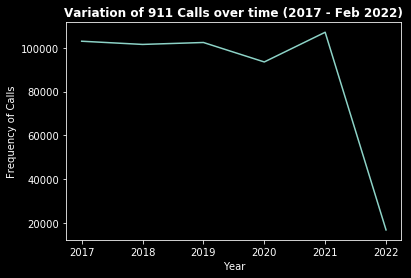

In [75]:
plt.plot(df_year_calls['year'], df_year_calls['call_counter'])
plt.title("Variation of 911 Calls over time (2017 - Feb 2022)",fontweight="bold")
plt.ylabel("Frequency of Calls")
plt.xlabel("Year")

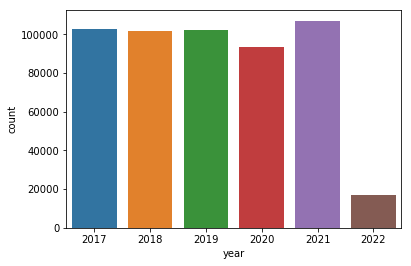

In [30]:
ax = sns.countplot(x='year', data=df)

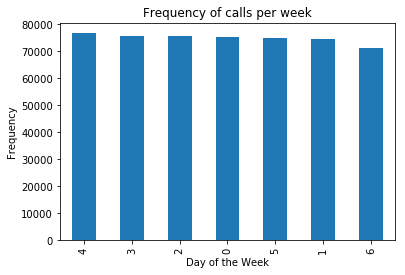

In [40]:
#Frequency of calls per week
df["day_of_week"].value_counts().plot(kind="bar")
plt.xlabel('Day of the Week') 
plt.ylabel('Frequency') 
plt.title('Frequency of calls per week') 
plt.style.use('dark_background')

In [41]:
top5_DayOfWeek = pd.DataFrame(df.groupby("day_of_week").count()["datetime"].sort_values(ascending=False).head(5))
top5_DayOfWeek.columns = ["Frequency of Calls"]
top5_DayOfWeek.style.background_gradient(cmap='Reds')

,Frequency of Calls
day_of_week,
4,76704
3,75707
2,75683
0,75247
5,75020


### Mon, Wed, Thur, Fri, Sat have the highest call counter

In [42]:
pd.set_option("display.max_rows", None, "display.max_columns", None)

# Monthly call counter in each year

In [71]:
# Creating a dataframe
df_year_month_calls = pd.DataFrame(df.groupby(["year", "month"])["datetime"].count())
df_year_month_calls = df_year_month_calls.rename(columns={"datetime": "call_counter"})
df_year_month_calls = df_year_month_calls.reset_index()
df_year_month_calls

,year,month,call_counter
0,2017,1,8712
1,2017,2,7633
2,2017,3,8304
3,2017,4,8046
4,2017,5,8880
5,2017,6,8702
6,2017,7,9310
7,2017,8,9349
8,2017,9,8728
9,2017,10,8673


In [191]:
df_year_month_calls.to_csv('../Data/monthly_data.csv', index=False)

Text(0.5, 0, 'month')

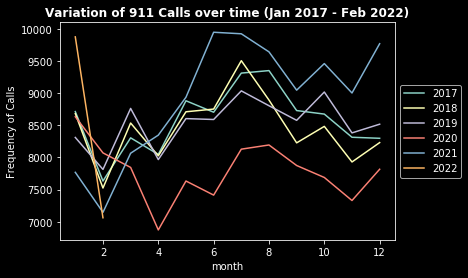

In [109]:
years = [2017, 2018, 2019, 2020, 2021, 2022]
for year in years:
    df_year_month_calls_plot = df_year_month_calls[df_year_month_calls['year'] == year]
    plt.plot(df_year_month_calls_plot['month'], df_year_month_calls_plot['call_counter'])
plt.legend(years, loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.title("Variation of 911 Calls over time (Jan 2017 - Feb 2022)",fontweight="bold")
plt.ylabel("Frequency of Calls")
plt.xlabel("month")

In [50]:
# Creating  Pivot Table
df_year_month_calls_pivot = df_year_month_calls.pivot_table(index=["year"],columns="month",values="call_counter")
df_year_month_calls_pivot

month,1,2,3,4,5,6,7,8,9,10,11,12
year,,,,,,,,,,,,
2017,8712.0,7633.0,8304.0,8046.0,8880.0,8702.0,9310.0,9349.0,8728.0,8673.0,8313.0,8297.0
2018,8681.0,7524.0,8534.0,8025.0,8709.0,8751.0,9503.0,8891.0,8226.0,8482.0,7929.0,8230.0
2019,8310.0,7813.0,8761.0,7966.0,8603.0,8589.0,9034.0,8803.0,8576.0,9016.0,8381.0,8516.0
2020,8632.0,8070.0,7844.0,6873.0,7633.0,7414.0,8128.0,8193.0,7874.0,7688.0,7330.0,7816.0
2021,7768.0,7146.0,8065.0,8346.0,8935.0,9945.0,9921.0,9640.0,9045.0,9458.0,9001.0,9767.0
2022,9873.0,7062.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


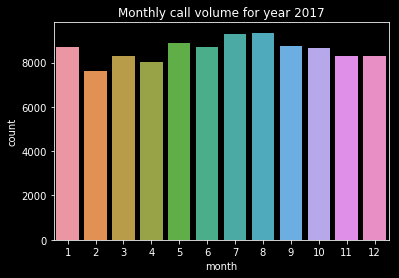

In [195]:
ax = sns.countplot(x='month', data=df.loc[df['year'] == 2017]).set(title='Monthly call volume for year 2017')

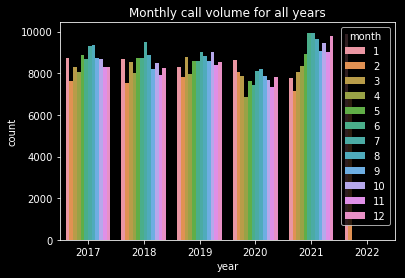

In [196]:
ax = sns.countplot(x='year', data=df, hue='month').set(title='Monthly call volume for all years')

In [197]:
top5_Months = pd.DataFrame(df.groupby("month").count()["datetime"].sort_values(ascending=False).head(5))
top5_Months.columns = ["Frequency of Calls"]
top5_Months.style.background_gradient(cmap='Reds')

,Frequency of Calls
month,
1,51976
7,45896
2,45248
8,44876
6,43401


### Jan, Feb, Jun, July, Aug have the highest call counter

# Hourly call counter for each month in a year

In [77]:
# Creating a dataframe
df_year_month_hour_calls = pd.DataFrame(df.groupby(["year", "month", "hour"])["datetime"].count())
df_year_month_hour_calls = df_year_month_hour_calls.rename(columns={"datetime": "call_counter"})
df_year_month_hour_calls = df_year_month_hour_calls.reset_index()
df_year_month_hour_calls

,year,month,hour,call_counter
0,2017,1,0,298
1,2017,1,1,291
2,2017,1,2,252
3,2017,1,3,211
4,2017,1,4,197
5,2017,1,5,195
6,2017,1,6,225
7,2017,1,7,312
8,2017,1,8,339
9,2017,1,9,369


Text(0.5, 0, 'hours')

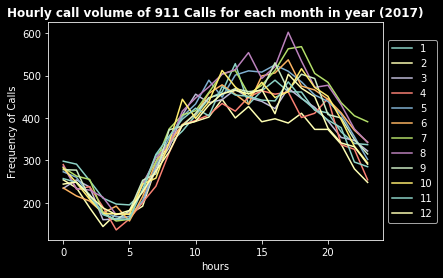

In [199]:
years = [2017]
months = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
for year in years:
    for month in months:
        df_year_month_hour_calls_plot = df_year_month_hour_calls[(df_year_month_hour_calls['year'] == year) & (df_year_month_hour_calls['month'] == month)]
        plt.plot(df_year_month_hour_calls_plot['hour'], df_year_month_hour_calls_plot['call_counter'])
plt.legend(months, loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.title("Hourly call volume of 911 Calls for each month in year (2017)", fontweight="bold")
plt.ylabel("Frequency of Calls")
plt.xlabel("hours")

Text(0.5, 1.0, 'Frequency of calls per hour')

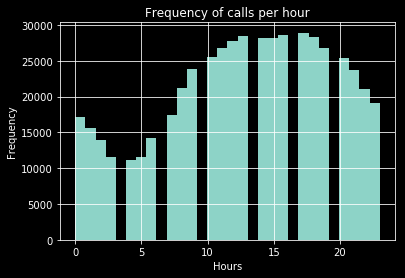

In [198]:
#hourly distribution of calls for all 5 year
df['hour'].hist(bins=30)
plt.xlabel('Hours') 
plt.ylabel('Frequency') 
plt.title('Frequency of calls per hour')

In [200]:
top5_hour = pd.DataFrame(df.groupby("hour").count()["datetime"].sort_values(ascending=False).head(5))
top5_hour.columns = ["Frequency of Calls"]
top5_hour.style.background_gradient(cmap='Reds')

,Frequency of Calls
hour,
17,28934
16,28547
13,28414
18,28322
15,28168


### 13, 15, 16, 17, 18 hrs have the highest call volume

# Hourly Call Volume for last 5 years

In [79]:
# Creating a dataframe
df_year_month_day_hour_calls = pd.DataFrame(df.groupby(["year", "month", "day_of_month", "hour"])["datetime"].count())
df_year_month_day_hour_calls = df_year_month_day_hour_calls.rename(columns={"datetime": "call_counter"})
df_year_month_day_hour_calls = df_year_month_day_hour_calls.reset_index()
df_year_month_day_hour_calls

,year,month,day_of_month,hour,call_counter
0,2017,1,1,0,25
1,2017,1,1,1,24
2,2017,1,1,2,18
3,2017,1,1,3,18
4,2017,1,1,4,10
5,2017,1,1,5,9
6,2017,1,1,6,3
7,2017,1,1,7,13
8,2017,1,1,8,10
9,2017,1,1,9,11


Text(0.5, 0, 'hours')

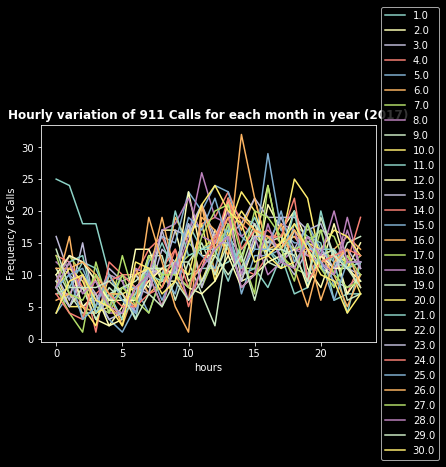

In [124]:
years = [2017]
months = [1]
days = [i for i in np.linspace(1, 30, num=30)]
for year in years:
    for month in months:
        for day in days:
            df_year_month_day_hour_calls_plot = df_year_month_day_hour_calls[(df_year_month_day_hour_calls['year'] == year) & (df_year_month_day_hour_calls['month'] == month) & (df_year_month_day_hour_calls['day_of_month'] == day)]
            plt.plot(df_year_month_day_hour_calls_plot['hour'], df_year_month_day_hour_calls_plot['call_counter'])
plt.legend(days, loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.title("Hourly variation of 911 Calls for each month in year (2017)", fontweight="bold")
plt.ylabel("Frequency of Calls")
plt.xlabel("hours")

In [202]:
df_year_month_day_hour_calls.to_csv('../Data/hourly_data.csv', index=False)

In [168]:
call_counter_df = df_year_month_day_hour_calls.copy()

In [169]:
call_counter_df.columns

Index(['year', 'month', 'day_of_month', 'hour', 'call_counter'], dtype='object')

In [170]:
# rearranging the columns
cols = ['day_of_month', 'month', 'year', 'hour', 'call_counter']
call_counter_df = call_counter_df[cols]
call_counter_df.head()

,day_of_month,month,year,hour,call_counter
0,1,1,2017,0,25
1,1,1,2017,1,24
2,1,1,2017,2,18
3,1,1,2017,3,18
4,1,1,2017,4,10


In [171]:
call_counter_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45064 entries, 0 to 45063
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   day_of_month  45064 non-null  int64
 1   month         45064 non-null  int64
 2   year          45064 non-null  int64
 3   hour          45064 non-null  int64
 4   call_counter  45064 non-null  int64
dtypes: int64(5)
memory usage: 1.7 MB


In [183]:
data = call_counter_df.copy()
data['dateInt'] = data['year'].astype(str) + data['month'].astype(str).str.zfill(2) + data['day_of_month'].astype(str).str.zfill(2)
data['date'] = pd.to_datetime(data['dateInt'], format='%Y%m%d')

del data['dateInt']

# Time Series Feature Engineering

1. day of month
2. month
3. year
4. hour
5. day of year
6. day of week
7. week of year

In [187]:
data['day_of_year'] = data['date'].apply(lambda time: time.dayofyear)
data['day_of_week'] = data['date'].apply(lambda time: time.dayofweek)
data['week_of_year'] = data['date'].apply(lambda time: time.weekofyear)
data.head()

,date,day_of_month,month,year,hour,call_counter,day_of_year,day_of_week,week_of_year
0,2017-01-01,1,1,2017,0,25,1,6,52
1,2017-01-01,1,1,2017,1,24,1,6,52
2,2017-01-01,1,1,2017,2,18,1,6,52
3,2017-01-01,1,1,2017,3,18,1,6,52
4,2017-01-01,1,1,2017,4,10,1,6,52


In [188]:
# rearranging the columns
cols = ['date', 'day_of_month', 'month', 'year', 'hour', 'day_of_year', 'day_of_week', 'week_of_year', 'call_counter']
data = data[cols]
data.head()

,date,day_of_month,month,year,hour,day_of_year,day_of_week,week_of_year,call_counter
0,2017-01-01,1,1,2017,0,1,6,52,25
1,2017-01-01,1,1,2017,1,1,6,52,24
2,2017-01-01,1,1,2017,2,1,6,52,18
3,2017-01-01,1,1,2017,3,1,6,52,18
4,2017-01-01,1,1,2017,4,1,6,52,10


In [189]:
data.tail()

,date,day_of_month,month,year,hour,day_of_year,day_of_week,week_of_year,call_counter
45059,2022-02-24,24,2,2022,3,55,3,8,5
45060,2022-02-24,24,2,2022,4,55,3,8,8
45061,2022-02-24,24,2,2022,5,55,3,8,8
45062,2022-02-24,24,2,2022,6,55,3,8,6
45063,2022-02-24,24,2,2022,7,55,3,8,10


In [190]:
data.to_csv('../Data/processed_data.csv', index=False)

# End of Notebook 1